In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/data-storm-6-0/sample_submission_storming_round.csv
/kaggle/input/data-storm-6-0/train_storming_round.csv
/kaggle/input/data-storm-6-0/test_storming_round.csv


In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [4]:
train_data = pd.read_csv('/kaggle/input/data-storm-6-0/train_storming_round.csv')
test_data = pd.read_csv('/kaggle/input/data-storm-6-0/test_storming_round.csv')

In [4]:
train_data.head()

,row_id,agent_code,agent_age,agent_join_month,first_policy_sold_month,year_month,unique_proposals_last_7_days,unique_proposals_last_15_days,unique_proposals_last_21_days,unique_proposal,...,unique_quotations,unique_customers_last_7_days,unique_customers_last_15_days,unique_customers_last_21_days,unique_customers,new_policy_count,ANBP_value,net_income,number_of_policy_holders,number_of_cash_payment_policies
0,1,455ca878,45,2/1/2021,9/1/2023,1/1/2023,3,6,2,12,...,9,3,4,8,15,0,0,93313,30,162
1,2,c823ce77,48,4/1/2022,2/1/2024,1/1/2023,1,4,12,21,...,14,4,3,10,17,25,1071450,164804,0,175
2,3,62154055,53,5/1/2020,9/1/2023,1/1/2023,3,5,5,17,...,14,3,7,11,21,26,1601210,426690,84,78
3,4,c58bfa6e,44,7/1/2019,3/1/2022,1/1/2023,1,0,12,17,...,11,2,2,9,13,18,283230,47793,39,144
4,5,b1e5f770,20,9/1/2020,2/1/2023,1/1/2023,0,6,10,17,...,13,3,10,6,19,20,1957680,562239,19,40


## Summary statistics

In [5]:
train_data.columns

Index(['row_id', 'agent_code', 'agent_age', 'agent_join_month',
       'first_policy_sold_month', 'year_month', 'unique_proposals_last_7_days',
       'unique_proposals_last_15_days', 'unique_proposals_last_21_days',
       'unique_proposal', 'unique_quotations_last_7_days',
       'unique_quotations_last_15_days', 'unique_quotations_last_21_days',
       'unique_quotations', 'unique_customers_last_7_days',
       'unique_customers_last_15_days', 'unique_customers_last_21_days',
       'unique_customers', 'new_policy_count', 'ANBP_value', 'net_income',
       'number_of_policy_holders', 'number_of_cash_payment_policies'],
      dtype='object')

In [7]:
train_data.describe()

,row_id,agent_age,unique_proposals_last_7_days,unique_proposals_last_15_days,unique_proposals_last_21_days,unique_proposal,unique_quotations_last_7_days,unique_quotations_last_15_days,unique_quotations_last_21_days,unique_quotations,unique_customers_last_7_days,unique_customers_last_15_days,unique_customers_last_21_days,unique_customers,new_policy_count,ANBP_value,net_income,number_of_policy_holders,number_of_cash_payment_policies
count,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,1.530800e+04,1.530800e+04,15308.000000,15308.000000
mean,7654.500000,40.585772,1.491246,2.991116,10.045728,17.516527,1.989679,2.996538,4.469624,13.922394,2.995493,4.997714,7.500523,15.493729,20.269990,1.025338e+06,2.280414e+05,30.968317,101.180886
std,4419.183296,11.688204,1.119554,2.001613,6.037296,6.616954,1.420996,2.004386,2.875329,4.663777,1.644117,2.438918,3.468597,4.542321,9.541693,8.054989e+05,1.736671e+05,24.621933,75.323464
min,1.000000,20.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000e+00,1.160000e+03,0.000000,0.000000
25%,3827.750000,31.000000,0.000000,1.000000,5.000000,12.000000,1.000000,1.000000,2.000000,11.000000,2.000000,3.000000,5.000000,12.000000,15.000000,3.473238e+05,9.282500e+04,12.000000,38.000000
50%,7654.500000,41.000000,1.000000,3.000000,10.000000,17.000000,2.000000,3.000000,4.000000,14.000000,3.000000,5.000000,8.000000,15.000000,21.000000,9.031445e+05,1.899740e+05,28.000000,90.000000
75%,11481.250000,51.000000,2.000000,5.000000,15.000000,23.000000,3.000000,5.000000,7.000000,17.000000,4.000000,7.000000,10.000000,19.000000,27.000000,1.560700e+06,3.217448e+05,48.000000,152.000000
max,15308.000000,60.000000,3.000000,6.000000,20.000000,34.000000,4.000000,6.000000,9.000000,32.000000,6.000000,10.000000,15.000000,31.000000,42.000000,3.933840e+06,1.140237e+06,116.000000,378.000000


In [6]:
numerical_cols = [
    'agent_age', 'unique_proposals_last_7_days', 'unique_proposals_last_15_days',
    'unique_proposals_last_21_days', 'unique_proposal', 'unique_quotations_last_7_days',
    'unique_quotations_last_15_days', 'unique_quotations_last_21_days', 'unique_quotations',
    'unique_customers_last_7_days', 'unique_customers_last_15_days', 'unique_customers_last_21_days',
    'unique_customers', 'new_policy_count', 'ANBP_value', 'net_income',
    'number_of_policy_holders', 'number_of_cash_payment_policies'
]

print("Summary Statistics for Numerical Columns:")
summary_stats = train_data[numerical_cols].describe()
print(summary_stats)

#summary_stats.to_csv('summary_statistics.csv')

Summary Statistics for Numerical Columns:
          agent_age  unique_proposals_last_7_days  \
count  15308.000000                  15308.000000   
mean      40.585772                      1.491246   
std       11.688204                      1.119554   
min       20.000000                      0.000000   
25%       31.000000                      0.000000   
50%       41.000000                      1.000000   
75%       51.000000                      2.000000   
max       60.000000                      3.000000   

       unique_proposals_last_15_days  unique_proposals_last_21_days  \
count                   15308.000000                   15308.000000   
mean                        2.991116                      10.045728   
std                         2.001613                       6.037296   
min                         0.000000                       0.000000   
25%                         1.000000                       5.000000   
50%                         3.000000                  

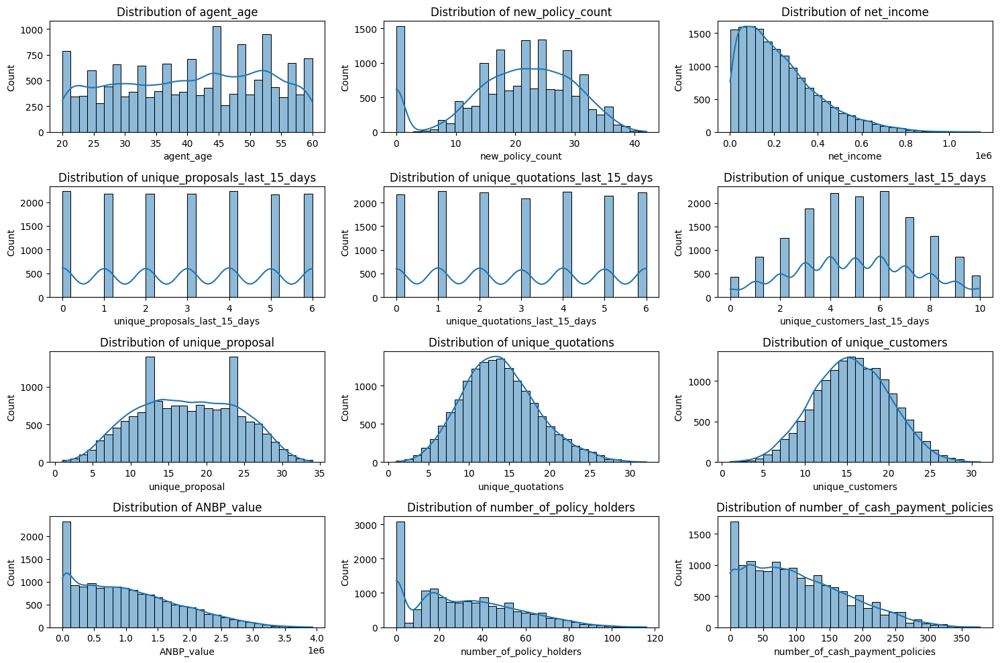

In [5]:
key_cols = [
    'agent_age', 'new_policy_count', 'net_income', 'unique_proposals_last_15_days',
    'unique_quotations_last_15_days', 'unique_customers_last_15_days','unique_proposal',
    'unique_quotations','unique_customers','ANBP_value',
    'number_of_policy_holders', 'number_of_cash_payment_policies'
] 

plt.figure(figsize=(15, 10))
for i, col in enumerate(key_cols, 1):
    plt.subplot(4, 3, i)
    sns.histplot(train_data[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
plt.tight_layout()
plt.show()

- NILL agents are those with `new_policy_count == 0`


In [9]:
nill_agents = len(train_data[train_data['new_policy_count'] == 0])
total_agents = len(train_data)
nill_percentage = (nill_agents / total_agents) * 100

print(f"Percentage of NILL agents: {nill_percentage:.2f}%")

Percentage of NILL agents: 9.99%


NILL Agents: 9.99% of records have new_policy_count == 0, indicating a notable but not overwhelming proportion of NILL agents.

- Bar plot to show the proportion of NILL vs. active agents.

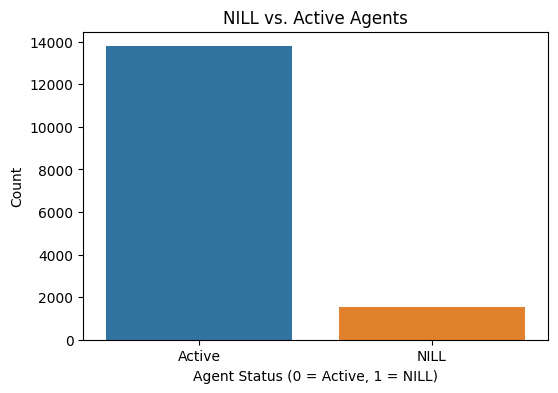

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

train_data['is_NILL'] = (train_data['new_policy_count'] == 0).astype(int)
test_data['is_NILL'] = (test_data['new_policy_count'] == 0).astype(int)

plt.figure(figsize=(6, 4))
sns.countplot(x='is_NILL', data=train_data)
plt.title('NILL vs. Active Agents')
plt.xlabel('Agent Status (0 = Active, 1 = NILL)')
plt.ylabel('Count')
plt.xticks([0, 1], ['Active', 'NILL'])
plt.show()

### Columns like `net_income`, `ANBP_value`, etc., are right-skewed (long right tail).
- Applying log transformation to normalize them for better modeling.

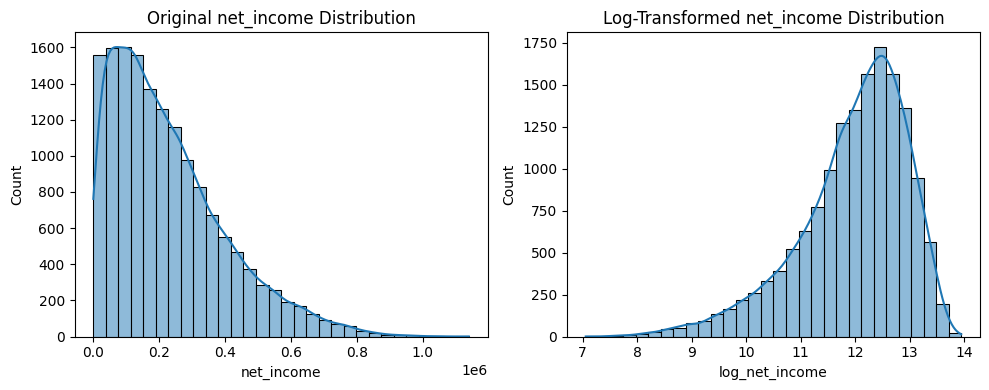

In [9]:
import numpy as np

skewed_cols = ['net_income', 'ANBP_value', 'number_of_policy_holders', 'number_of_cash_payment_policies']
for col in skewed_cols:
    train_data[f'log_{col}'] = np.log1p(train_data[col])
    test_data[f'log_{col}'] = np.log1p(test_data[col])

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
sns.histplot(train_data['net_income'], kde=True, bins=30)
plt.title('Original net_income Distribution')
plt.subplot(1, 2, 2)
sns.histplot(train_data['log_net_income'], kde=True, bins=30)
plt.title('Log-Transformed net_income Distribution')
plt.tight_layout()
plt.show()

### Composite Activity Score
- Combine `unique_proposals_last_21_days` and `unique_quotations` into an `activity_score`.
- High correlation with `new_policy_count` (e.g., ρ=0.62 for proposals) justifies this feature.

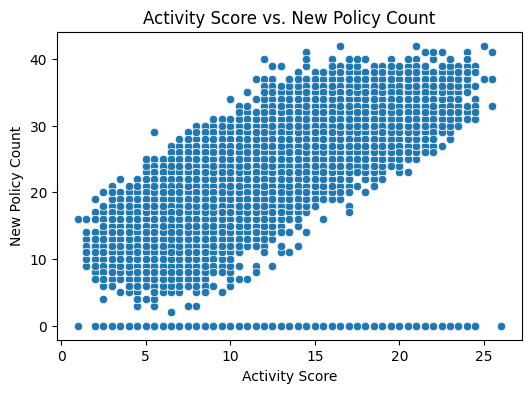

In [11]:
train_data['activity_score'] = (train_data['unique_proposals_last_21_days'] + train_data['unique_quotations']) / 2
test_data['activity_score'] = (test_data['unique_proposals_last_21_days'] + test_data['unique_quotations']) / 2

plt.figure(figsize=(6, 4))
sns.scatterplot(x='activity_score', y='new_policy_count', data=train_data)
plt.title('Activity Score vs. New Policy Count')
plt.xlabel('Activity Score')
plt.ylabel('New Policy Count')
plt.show()

In [12]:
train_data.columns

Index(['row_id', 'agent_code', 'agent_age', 'agent_join_month',
       'first_policy_sold_month', 'year_month', 'unique_proposals_last_7_days',
       'unique_proposals_last_15_days', 'unique_proposals_last_21_days',
       'unique_proposal', 'unique_quotations_last_7_days',
       'unique_quotations_last_15_days', 'unique_quotations_last_21_days',
       'unique_quotations', 'unique_customers_last_7_days',
       'unique_customers_last_15_days', 'unique_customers_last_21_days',
       'unique_customers', 'new_policy_count', 'ANBP_value', 'net_income',
       'number_of_policy_holders', 'number_of_cash_payment_policies'],
      dtype='object')

## How do sales patterns vary by month, and are there unexpected drops or spikes performance?

### Convert year_month to Datetime
- `year_month` is currently an object (string) in format "YYYY-MM-DD".
- Convert to datetime for time series analysis.

In [12]:
import pandas as pd

train_data['year_month'] = pd.to_datetime(train_data['year_month'], errors='coerce')

print("Data type of year_month after conversion:", train_data['year_month'].dtype)
print("Sample year_month values:")
print(train_data['year_month'].head())

Data type of year_month after conversion: datetime64[ns]
Sample year_month values:
0   2023-01-01
1   2023-01-01
2   2023-01-01
3   2023-01-01
4   2023-01-01
Name: year_month, dtype: datetime64[ns]


### Aggregate Sales by Month
- Sum `new_policy_count` for each `year_month` to analyze total sales trends.

In [14]:
monthly_sales = train_data.groupby('year_month')['new_policy_count'].sum().reset_index()

print("Monthly Sales Data:")
print(monthly_sales.head())

Monthly Sales Data:
  year_month  new_policy_count
0 2023-01-01             12887
1 2023-02-01             13617
2 2023-03-01             13591
3 2023-04-01             13629
4 2023-05-01             14248


### Visualize Sales Trends
- Use a line plot to observe trends, seasonality, or anomalies in monthly sales.

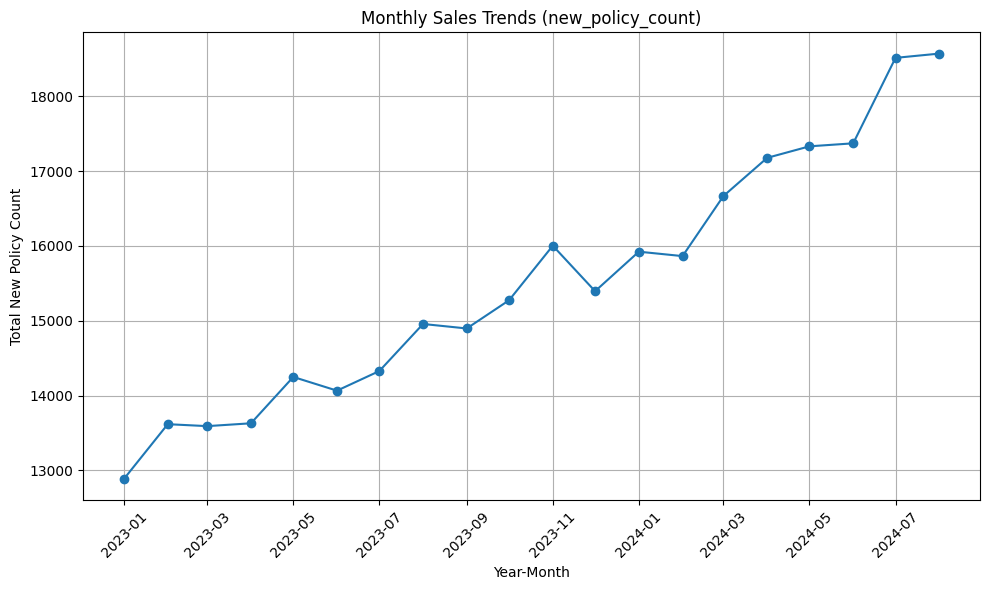

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
plt.plot(monthly_sales['year_month'], monthly_sales['new_policy_count'], marker='o')
plt.title('Monthly Sales Trends (new_policy_count)')
plt.xlabel('Year-Month')
plt.ylabel('Total New Policy Count')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

Monthly Sales has gradually increased with some slight fluctuations.There is a sudden drop in 2023-12.But it has recovered again.

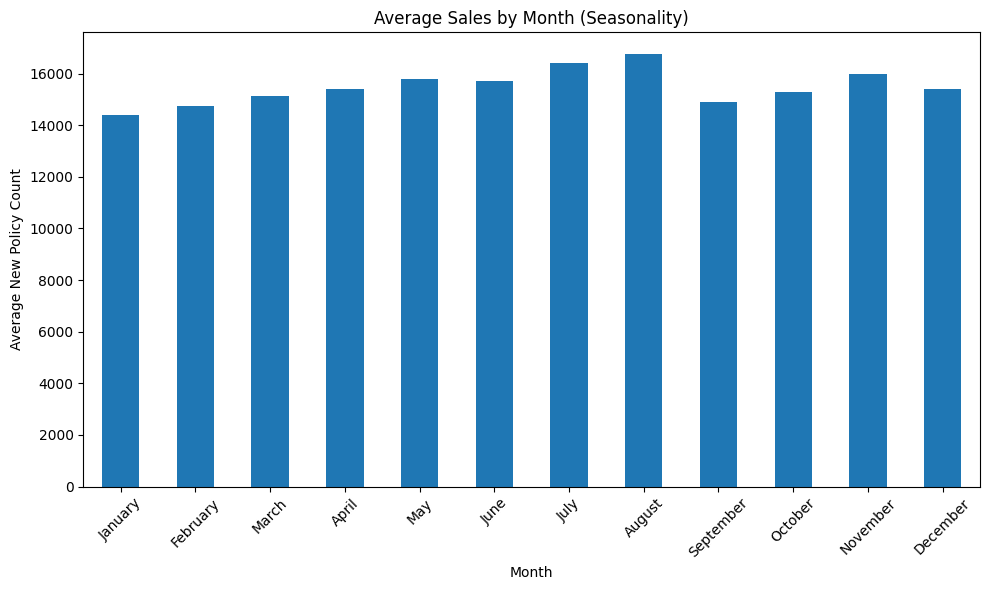

In [17]:
monthly_sales['month'] = monthly_sales['year_month'].dt.strftime('%B')

seasonal_patterns = monthly_sales.groupby('month')['new_policy_count'].mean().reindex([
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
])

plt.figure(figsize=(10, 6))
seasonal_patterns.plot(kind='bar')
plt.title('Average Sales by Month (Seasonality)')
plt.xlabel('Month')
plt.ylabel('Average New Policy Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

There is a monotonically increasing pattern of average sales from January to August.Then there is a sudden drop and it recovers from ir gradually after.

### NILL Agents Over Time
- Analyze how the proportion of NILL agents (`is_NILL == 1`) changes monthly.

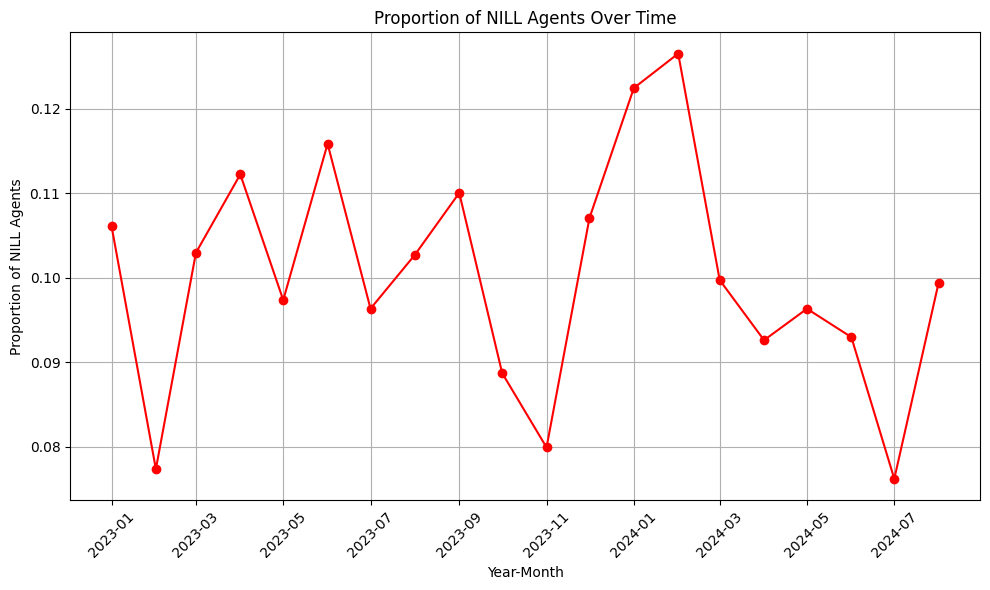

In [25]:
nill_trends = train_data.groupby('year_month')['is_NILL'].mean().reset_index()

plt.figure(figsize=(10, 6))
plt.plot(nill_trends['year_month'], nill_trends['is_NILL'], marker='o', color='red')
plt.title('Proportion of NILL Agents Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Proportion of NILL Agents')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

### Sales vs. Activity Score Over Time
- Check if monthly sales trends correlate with `activity_score` (proposals + quotations).

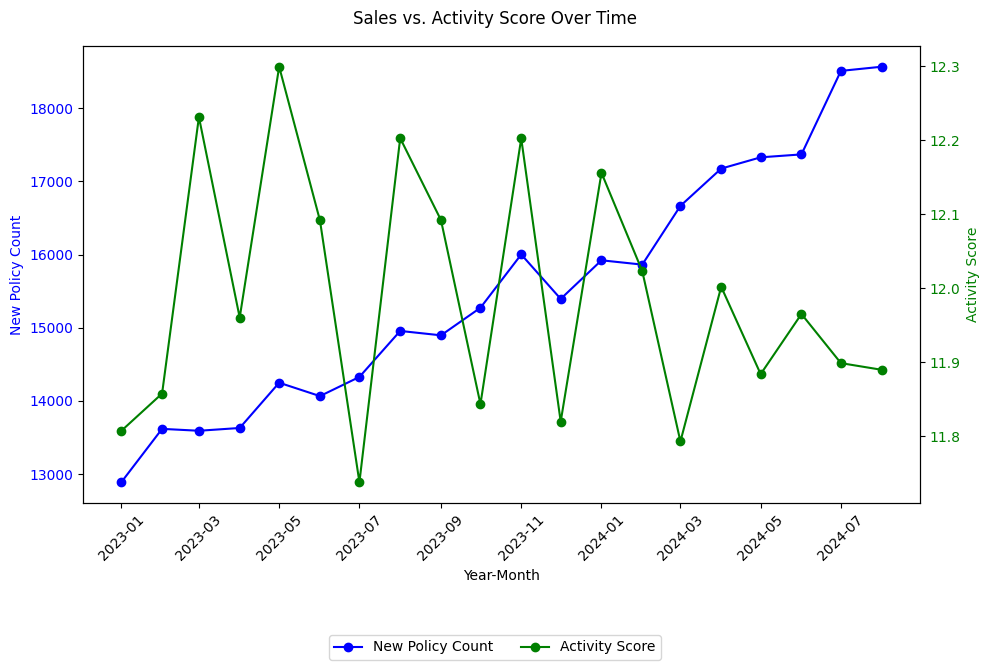

In [26]:
monthly_activity = train_data.groupby('year_month')['activity_score'].mean().reset_index()

fig, ax1 = plt.subplots(figsize=(10, 6))
ax1.plot(monthly_sales['year_month'], monthly_sales['new_policy_count'], marker='o', color='blue', label='New Policy Count')
ax1.set_xlabel('Year-Month')
ax1.set_ylabel('New Policy Count', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.tick_params(axis='x', rotation=45)

ax2 = ax1.twinx()
ax2.plot(monthly_activity['year_month'], monthly_activity['activity_score'], marker='o', color='green', label='Activity Score')
ax2.set_ylabel('Activity Score', color='green')
ax2.tick_params(axis='y', labelcolor='green')

fig.suptitle('Sales vs. Activity Score Over Time')
fig.legend(loc='upper center', bbox_to_anchor=(0.5, -0.05), ncol=2)
plt.tight_layout()
plt.show()

Sales show a long-term increase with a summer peak (July-August).
NILL proportion varies, with higher inactivity in early 2024.
Activity score correlates with sales, reinforcing its predictive potential.

## Multivariate Analysis

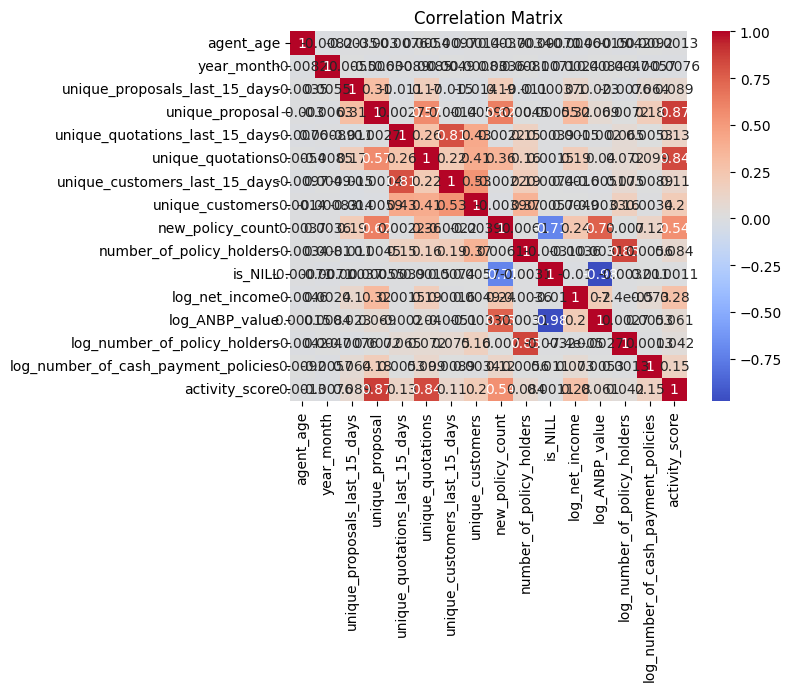

In [19]:
import matplotlib.pyplot as plt

features = ['agent_age', 'year_month',
       'unique_proposals_last_15_days',
       'unique_proposal',
       'unique_quotations_last_15_days',
       'unique_quotations',
       'unique_customers_last_15_days',
       'unique_customers', 'new_policy_count',
       'number_of_policy_holders',
       'is_NILL', 'log_net_income', 'log_ANBP_value',
       'log_number_of_policy_holders', 'log_number_of_cash_payment_policies',
       'activity_score']

corr = train_data[features].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

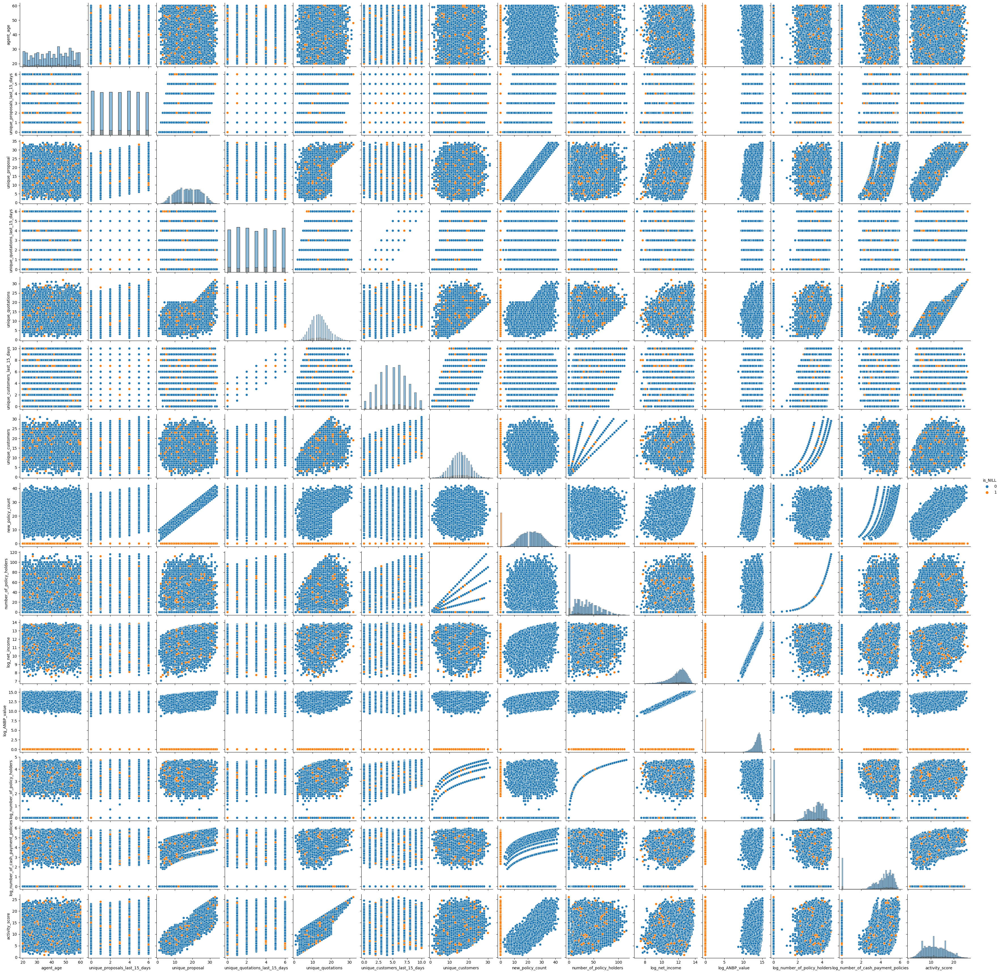

In [20]:
sns.pairplot(train_data[features], hue='is_NILL', diag_kind='hist')
plt.show()

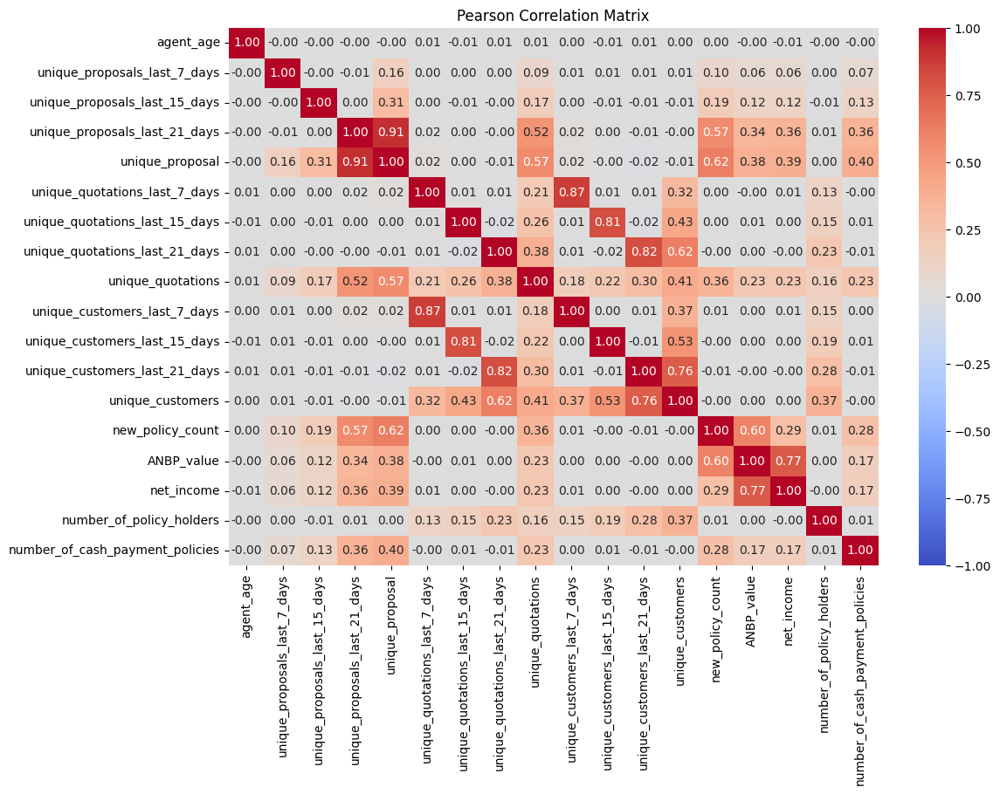

Correlations with new_policy_count:
new_policy_count                   1.000000
unique_proposal                    0.624904
ANBP_value                         0.602812
unique_proposals_last_21_days      0.569788
unique_quotations                  0.356495
net_income                         0.287899
number_of_cash_payment_policies    0.279041
unique_proposals_last_15_days      0.193934
unique_proposals_last_7_days       0.096184
unique_customers_last_7_days       0.007515
number_of_policy_holders           0.006099
agent_age                          0.003663
unique_quotations_last_15_days     0.002215
unique_quotations_last_7_days      0.001810
unique_customers_last_15_days     -0.002233
unique_quotations_last_21_days    -0.003038
unique_customers                  -0.003896
unique_customers_last_21_days     -0.007094
Name: new_policy_count, dtype: float64


In [7]:
correlation_matrix = train_data[numerical_cols].corr(method='pearson')

plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', vmin=-1, vmax=1)
plt.title('Pearson Correlation Matrix')
plt.show()

print("Correlations with new_policy_count:")
print(correlation_matrix['new_policy_count'].sort_values(ascending=False))

We can see the new_policy_count is mostly correlates with unique_proposoal,ANBP_value,unique_proposals_last_21_days

## How do individual agent trajectories evolve over time

In [13]:
agent_summary = train_data.groupby('agent_code')['new_policy_count'].sum().sort_values()
selected_agents = agent_summary.index[[0, len(agent_summary)//4, len(agent_summary)//2, 3*len(agent_summary)//4, -1]]  
subset = train_data[train_data['agent_code'].isin(selected_agents)]

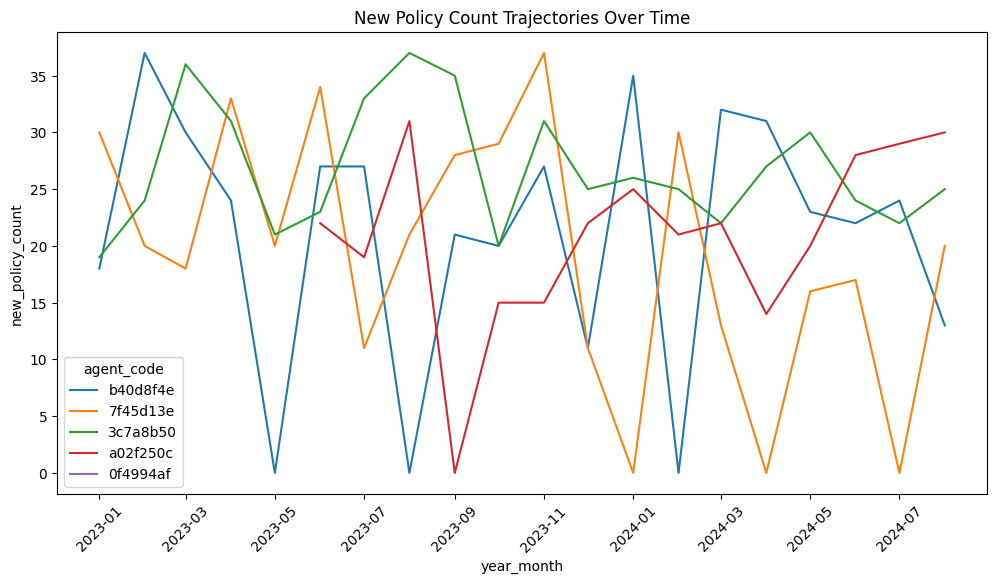

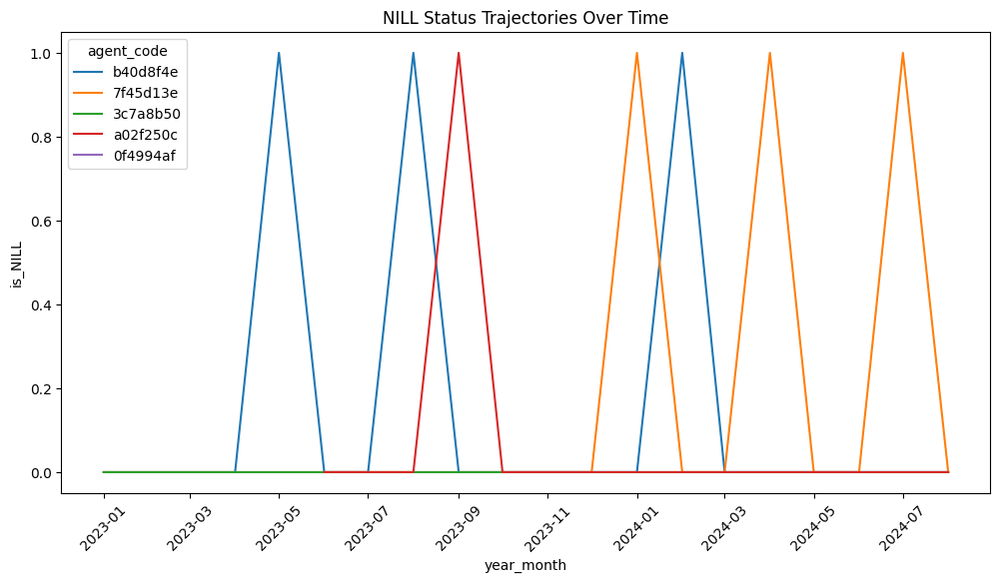

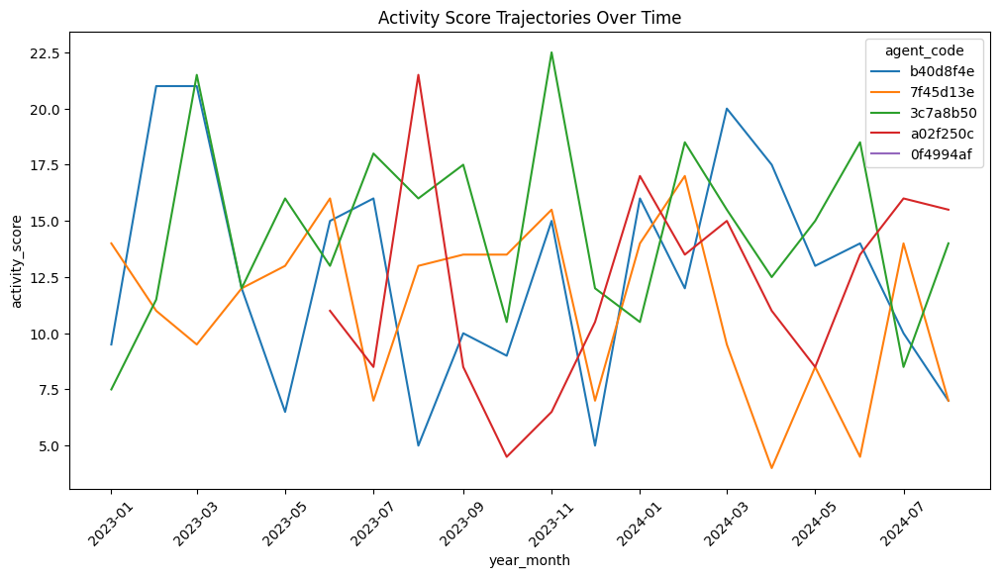

In [14]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=subset, x='year_month', y='new_policy_count', hue='agent_code')
plt.title('New Policy Count Trajectories Over Time')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 6))
sns.lineplot(data=subset, x='year_month', y='is_NILL', hue='agent_code')
plt.title('NILL Status Trajectories Over Time')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 6))
sns.lineplot(data=subset, x='year_month', y='activity_score', hue='agent_code')
plt.title('Activity Score Trajectories Over Time')
plt.xticks(rotation=45)
plt.show()

## Innovative EDA

- Segment top 5% of agents by `net_income` to identify success factors.

In [8]:
top_5_percentile = train_data['net_income'].quantile(0.95)

top_performers = train_data[train_data['net_income'] >= top_5_percentile]

print("Average Activity Metrics for Top Performers:")
print(top_performers[['unique_proposals_last_21_days', 'unique_quotations_last_21_days']].mean())

print("\nOverall Averages:")
print(train_data[['unique_proposals_last_21_days', 'unique_quotations_last_21_days']].mean())

Average Activity Metrics for Top Performers:
unique_proposals_last_21_days     15.823760
unique_quotations_last_21_days     4.536554
dtype: float64

Overall Averages:
unique_proposals_last_21_days     10.045728
unique_quotations_last_21_days     4.469624
dtype: float64


Top Performers: Top 5% by net_income have higher activity in unique_proposals_last_21_days , suggesting activity drives success.But there is no much difference in unique_quotations_last_21_days

### Age vs. Sales Performance
- `agent_age` has a low correlation (ρ=0.00) with `new_policy_count`.
- Bin ages to check for hidden patterns.

Average new_policy_count by Age Group:
age_group
20-30    20.218968
30-40    20.305456
40-50    20.283096
50-60    20.322183
Name: new_policy_count, dtype: float64


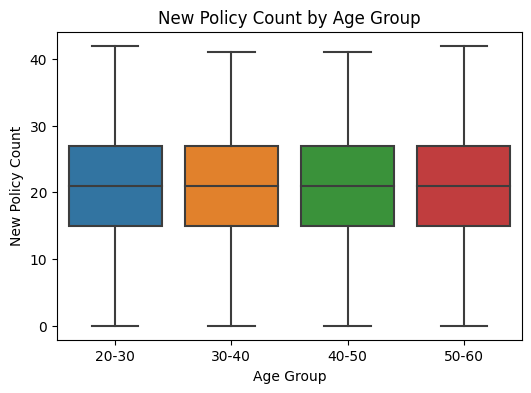

In [9]:
train_data['age_group'] = pd.cut(train_data['agent_age'], bins=[20, 30, 40, 50, 60], labels=['20-30', '30-40', '40-50', '50-60'])

print("Average new_policy_count by Age Group:")
print(train_data.groupby('age_group')['new_policy_count'].mean())

plt.figure(figsize=(6, 4))
sns.boxplot(x='age_group', y='new_policy_count', data=train_data)
plt.title('New Policy Count by Age Group')
plt.xlabel('Age Group')
plt.ylabel('New Policy Count')
plt.show()

Sales performance is consistent across age groups, confirming `agent_age` isn’t a strong predictor. Focus on activity metrics instead for modeling.

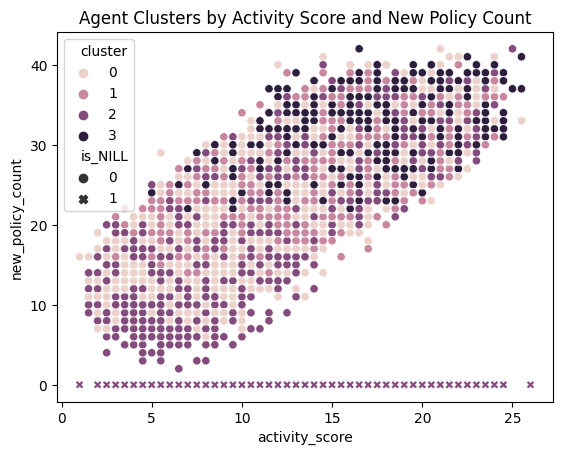

         new_policy_count   is_NILL  activity_score
cluster                                            
0               20.707163  0.000000       10.932397
1               23.955837  0.000000       12.677496
2               13.998479  0.290985       10.972803
3               29.662461  0.000000       16.023134


In [17]:
from sklearn.cluster import KMeans
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

features = ['activity_score', 'unique_proposals_last_21_days', 'log_net_income', 'ANBP_value']
X = train_data[features].fillna(0)

kmeans = KMeans(n_clusters=4, random_state=42)
train_data['cluster'] = kmeans.fit_predict(X)

sns.scatterplot(data=train_data, x='activity_score', y='new_policy_count', hue='cluster', style='is_NILL')
plt.title('Agent Clusters by Activity Score and New Policy Count')
plt.show()

cluster_summary = train_data.groupby('cluster')[['new_policy_count', 'is_NILL', 'activity_score']].mean()
print(cluster_summary)

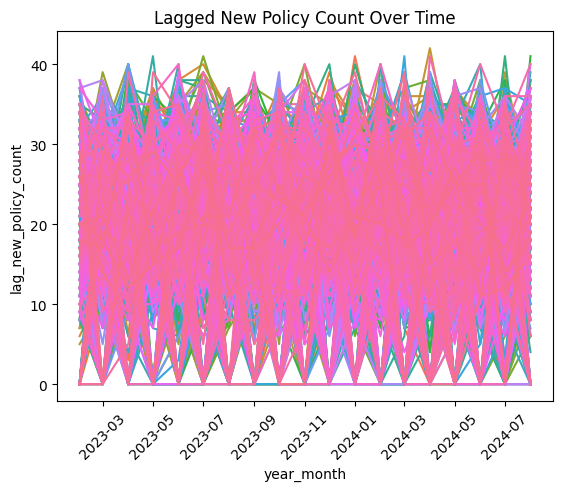

In [18]:
train_data['year_month'] = pd.to_datetime(train_data['year_month'], format='%Y-%m')
train_data = train_data.sort_values(['agent_code', 'year_month'])
train_data['lag_new_policy_count'] = train_data.groupby('agent_code')['new_policy_count'].shift(1)
train_data['rolling_activity'] = train_data.groupby('agent_code')['activity_score'].rolling(window=3, min_periods=1).mean().reset_index(0, drop=True)

sns.lineplot(data=train_data, x='year_month', y='lag_new_policy_count', hue='agent_code', legend=False)
plt.title('Lagged New Policy Count Over Time')
plt.xticks(rotation=45)
plt.show()

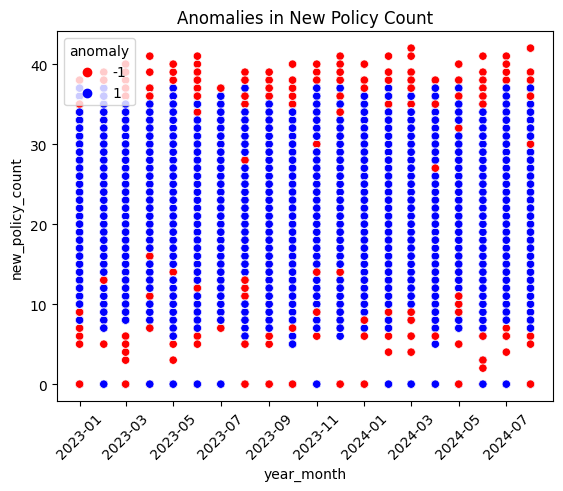

In [19]:
from sklearn.ensemble import IsolationForest

X_anomaly = train_data[['new_policy_count', 'activity_score']].fillna(0)
iso_forest = IsolationForest(contamination=0.1, random_state=42)
train_data['anomaly'] = iso_forest.fit_predict(X_anomaly)

sns.scatterplot(data=train_data, x='year_month', y='new_policy_count', hue='anomaly', palette={1: 'blue', -1: 'red'})
plt.title('Anomalies in New Policy Count')
plt.xticks(rotation=45)
plt.show()
